# Petit test avec pyroomacoustics, pour test des exemples simples de BSS avec fast MNMF2 (sans aucun apriori)

### Import obligatoire pour utilisé pyroom

In [109]:
import pyroomacoustics as pra 
import numpy as np
import matplotlib.pyplot as plt

import IPython.display

from mir_eval.separation import bss_eval_sources
from scipy.io import wavfile

## Configuration des signaux a séparés

In [110]:
fs, signal = wavfile.read("Bach_ Prélude, Cello suite Nr.1  Ophélie Gaillard.wav")
fs

44100

In [128]:
# concatanate audio samples to make them look long enough
# wav_files = [
#         ['samples/cmu_arctic_us_axb_a0004.wav',
#             'samples/cmu_arctic_us_axb_a0005.wav',
#             'samples/cmu_arctic_us_axb_a0006.wav',],
#         ['samples/cmu_arctic_us_aew_a0001.wav',
#             'samples/cmu_arctic_us_aew_a0002.wav',
#             'samples/cmu_arctic_us_aew_a0003.wav',]
#         ]

# signals = [ np.concatenate([wavfile.read(f)[1].astype(np.float32) for f in source_files]) for source_files in wav_files ]

In [129]:
wav_files = [['samples/BACH Cello Suite 1, Prelude, Violin - Kateryna Timokhina.wav'],
            ['samples/Bach_ Prélude, Cello suite Nr.1  Ophélie Gaillard.wav']]

signals = [ np.concatenate([wavfile.read(f)[1].astype(np.float32) for f in source_files]) for source_files in wav_files ]

In [130]:
signals = [signals[0].T[0], signals[1].T[0]]
signals = [signals[0][0:fs*10], signals[1][0:fs*10]]

## Dimensionnement de la salle simulée

In [131]:
# Dimension de la salle (8m par 9m, 2m de haut)
room_dim = [8, 9, 3]

# source locations and delays
locations = [[2.5, 2, 1], [2.5, 7, 1]]
delays = [0., 0.]

# create an anechoic room with sources and mics
room = pra.ShoeBox(room_dim, fs=44100, max_order=15, absorption=0.4, sigma2_awgn=1e-8)

# add mic and good source to room
# Add silent signals to all sources
for sig, d, loc in zip(signals, delays, locations):
    room.add_source(loc, signal=sig, delay=d)

# add microphone array
room.add_microphone_array(pra.MicrophoneArray(np.c_[[6.5, 4.49, 1], [6.5, 4.51, 1]], room.fs))  

#### Visualisation de la room 

Text(0.5, 0, 'z')

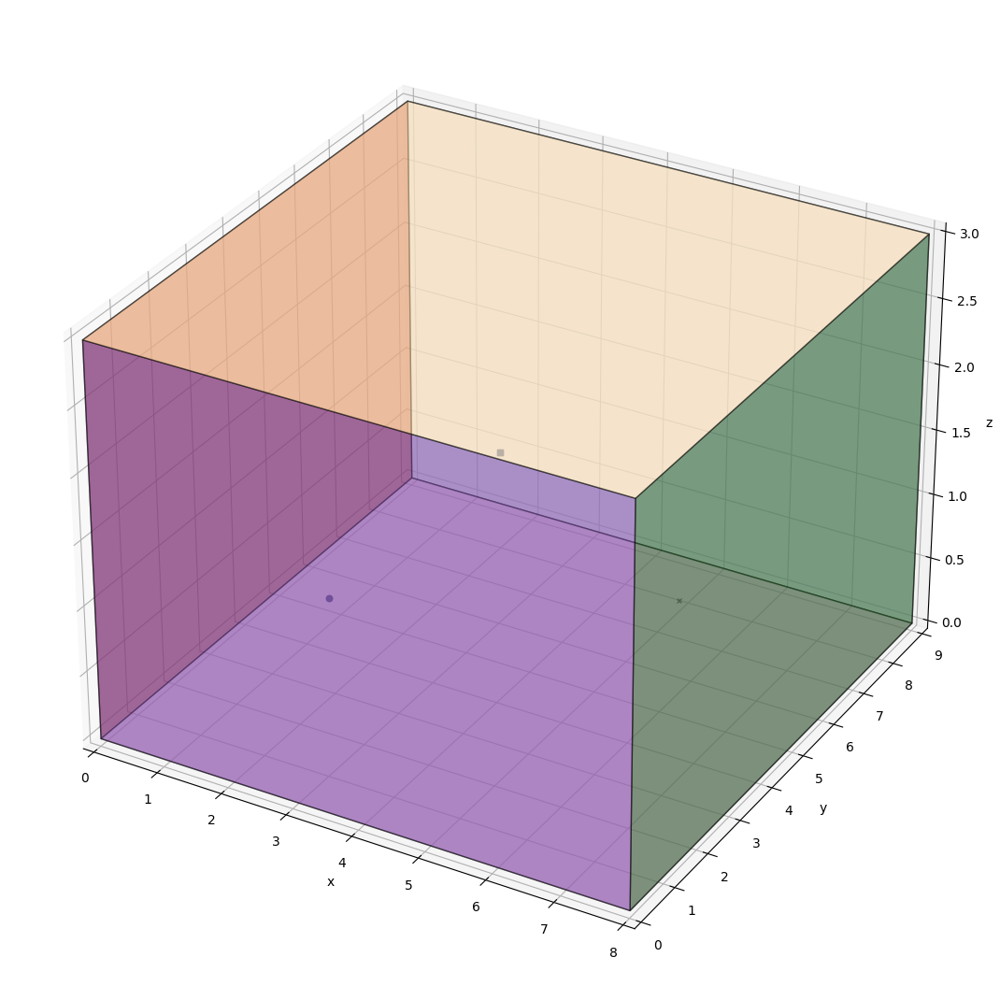

In [115]:
# Visualisation de la salle simulée avec les positions des sources, images et microphones
fig, ax = room.plot()
fig.set_size_inches(18.5, 10.5)
ax.set_xlim([0, 8])
ax.set_ylim([0, 9])
ax.set_zlim([0, 3])

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#### Réponse impulsionnelle liée à la room (simulée par pyroomacoustics)

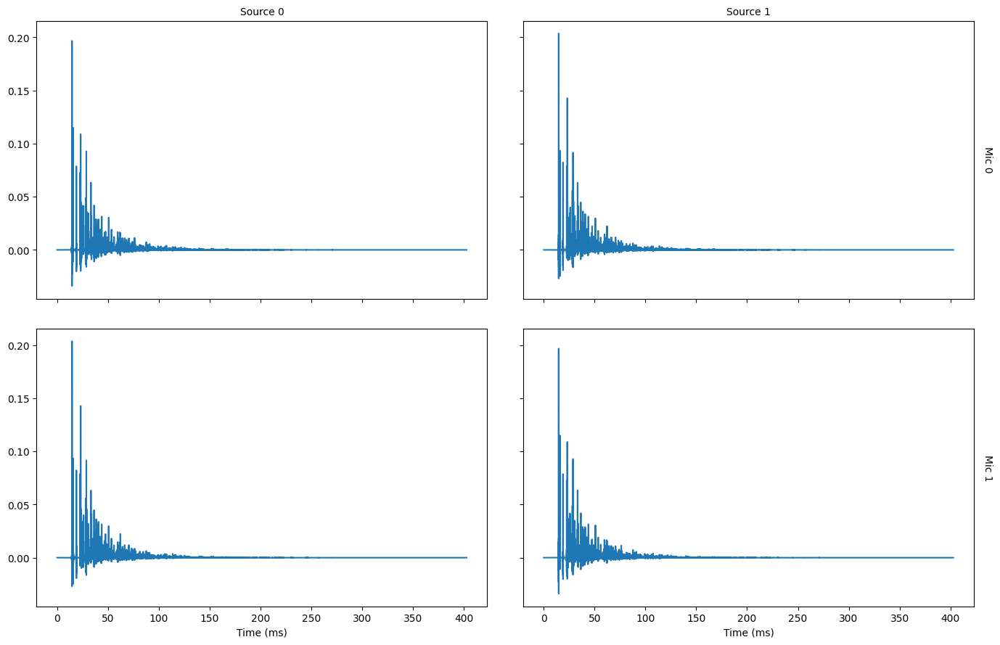

In [116]:
room.plot_rir()
fig = plt.gcf()
fig.set_size_inches(15, 10)

In [117]:
# The premix contains the signals before mixing at the microphones
# shape=(n_sources, n_mics, n_samples)
separate_recordings = room.simulate(return_premix=True)

# Mix down the recorded signals (n_mics, n_samples)
# i.e., just sum the array over the sources axis
mics_signals = np.sum(separate_recordings, axis=0)

final_signal = np.sum(mics_signals, axis=0)
# final_signal = np.concatenate([final_signal, final_signal])

# STFT parameters
L = 2048
hop = L // 4
win_a = pra.hamming(L)
win_s = pra.transform.stft.compute_synthesis_window(win_a, hop)

# Observation vector in the STFT domain
X = pra.transform.stft.analysis(mics_signals.T, L, hop, win=win_a)
X_final = pra.transform.stft.analysis(final_signal, L, hop, win=win_a)

# Reference signal to calculate performance of BSS - Correspond to the microphone 0 and 1.
ref0 = separate_recordings[:, 0, :]
ref1 = separate_recordings[:, 1, :]
SDR0, SIR0, SAR0, PERM0 = [], [], [], []
SDR1, SIR1, SAR1, PERM1 = [], [], [], []


# Callback function to monitor the convergence of the algorithm
def convergence_callback_micro0(Y):
    global SDR0, SIR0, SAR0
    y0 = pra.transform.stft.synthesis(Y, L, hop, win=win_s)
    y0 = y0[L - hop:, :].T
    m = np.minimum(y0.shape[1], ref0.shape[1])
    sdr, sir, sar, perm = bss_eval_sources(ref0[:,:m], y0[:,:m])
    SDR0.append(sdr)
    SIR0.append(sir)
    SAR0.append(sar)
    PERM0.append(perm)


def convergence_callback_micro1(Y):
    global SDR1, SIR1, SAR1
    y1 = pra.transform.stft.synthesis(Y, L, hop, win=win_s)
    y1 = y1[L - hop:, :].T
    m = np.minimum(y1.shape[1], ref1.shape[1])
    sdr, sir, sar, perm = bss_eval_sources(ref1[:,:m], y1[:,:m])
    SDR1.append(sdr)
    SIR1.append(sir)
    SAR1.append(sar)
    PERM1.append(perm)

### Mise en place de l'algorithme

In [118]:
# Correspond à la séparation de source, micro_0 
Y0 = pra.bss.fastmnmf2(X, n_src=2, n_iter=100, n_components=8, mic_index=0, W0=None, accelerate=True, callback=convergence_callback_micro0)

In [119]:
# Correspond à la séparation de source, micro_1
Y1 = pra.bss.fastmnmf2(X, n_src=2, n_iter=100, n_components=8, mic_index=1, W0=None, accelerate=True, callback=convergence_callback_micro1)

In [120]:
# Correspond à la séparation de source, micro_0 

# run iSTFT
y0 = pra.transform.stft.synthesis(Y0, L, hop, win=win_s)
y0 = y0[L - hop:, :].T
m0 = np.minimum(y0.shape[1], ref0.shape[1])

# Compare SIR and SDR with our reference signal, perm correspond to the index of the source
sdr0, sir0, sar0, perm0 = bss_eval_sources(ref0[:,:m0], y0[:,:m0])

In [121]:
# Correspond à la séparation de source, micro_1

# run iSTFT
y1 = pra.transform.stft.synthesis(Y1, L, hop, win=win_s)
y1 = y1[L - hop:, :].T
m1 = np.minimum(y1.shape[1], ref1.shape[1])

# Compare SIR and SDR with our reference signal, perm correspond to the index of the source
sdr1, sir1, sar1, perm1 = bss_eval_sources(ref1[:,:m1], y1[:,:m1])

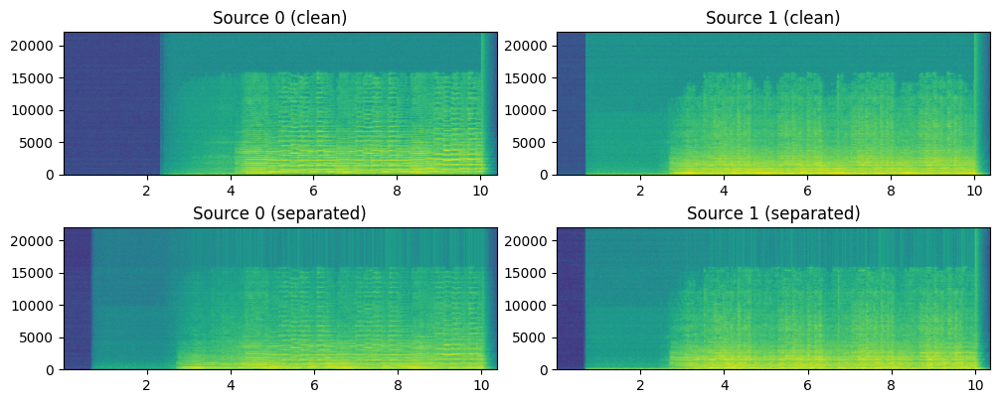

In [122]:
# Correspond à la séparation de source, micro_0 

fig = plt.figure()
fig.set_size_inches(10,  4)

plt.subplot(2,2,1)
plt.specgram(ref0[0,:], NFFT=1024, Fs=room.fs)
plt.title('Source 0 (clean)')

plt.subplot(2,2,2)
plt.specgram(ref0[1,:], NFFT=1024, Fs=room.fs)
plt.title('Source 1 (clean)')

plt.subplot(2,2,3)
plt.specgram(y0[perm0[0],:], NFFT=1024, Fs=room.fs)
plt.title('Source 0 (separated)')

plt.subplot(2,2,4)
plt.specgram(y0[perm0[1],:], NFFT=1024, Fs=room.fs)
plt.title('Source 1 (separated)')

plt.tight_layout(pad=0.5)

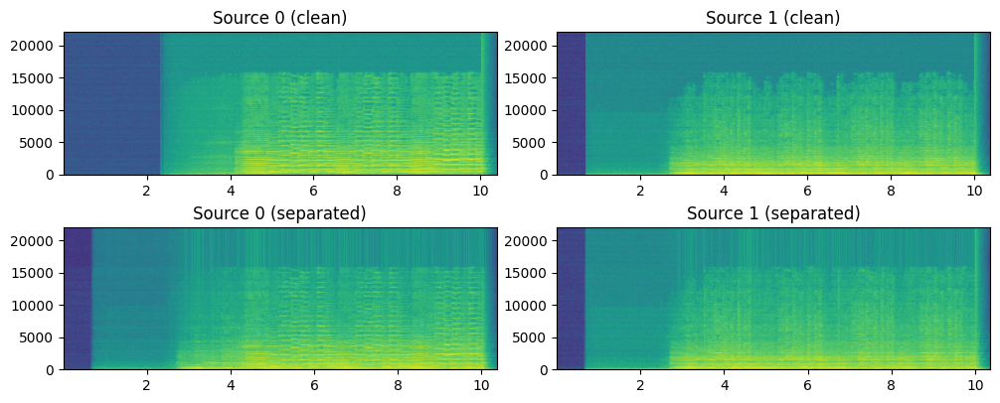

In [123]:
# Correspond à la séparation de source, micro_1

fig = plt.figure()
fig.set_size_inches(10,  4)

plt.subplot(2,2,1)
plt.specgram(ref1[0,:], NFFT=1024, Fs=room.fs)
plt.title('Source 0 (clean)')

plt.subplot(2,2,2)
plt.specgram(ref1[1,:], NFFT=1024, Fs=room.fs)
plt.title('Source 1 (clean)')

plt.subplot(2,2,3)
plt.specgram(y1[perm1[0],:], NFFT=1024, Fs=room.fs)
plt.title('Source 0 (separated)')

plt.subplot(2,2,4)
plt.specgram(y1[perm1[1],:], NFFT=1024, Fs=room.fs)
plt.title('Source 1 (separated)')

plt.tight_layout(pad=0.5)

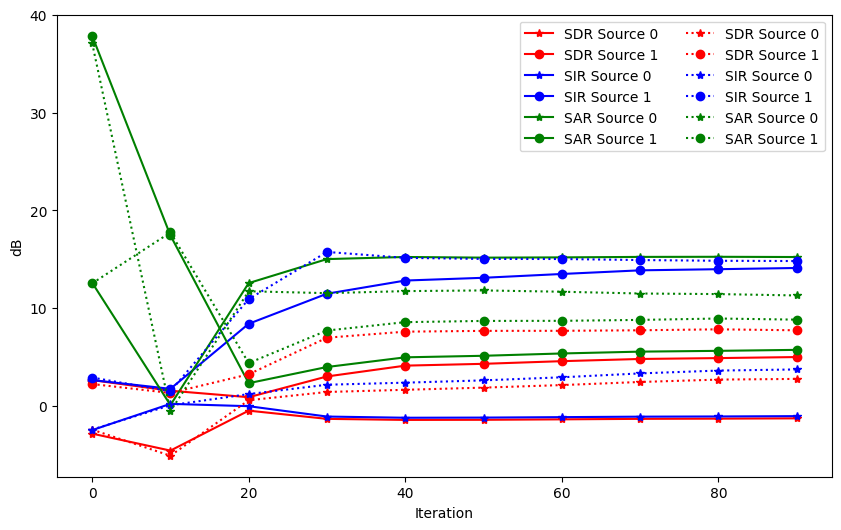

In [124]:
fig = plt.figure()
fig.set_size_inches(10, 6)
a = np.array(SDR0)
b = np.array(SIR0)
c = np.array(SAR0)

a0 = np.array(SDR1)
b0 = np.array(SIR1)
c0 = np.array(SAR1)

plt.plot(np.arange(a.shape[0]) * 10, a[:,0], label='SDR Source 0', c='r', marker='*')
plt.plot(np.arange(a.shape[0]) * 10, a[:,1], label='SDR Source 1', c='r', marker='o')
plt.plot(np.arange(b.shape[0]) * 10, b[:,0], label='SIR Source 0', c='b', marker='*')
plt.plot(np.arange(b.shape[0]) * 10, b[:,1], label='SIR Source 1', c='b', marker='o')
plt.plot(np.arange(c.shape[0]) * 10, c[:,0], label='SAR Source 0', c='g', marker='*')
plt.plot(np.arange(c.shape[0]) * 10, c[:,1], label='SAR Source 1', c='g', marker='o')

plt.plot(np.arange(a0.shape[0]) * 10, a0[:,0], label='SDR Source 0', c='r', marker='*', linestyle=':')
plt.plot(np.arange(a0.shape[0]) * 10, a0[:,1], label='SDR Source 1', c='r', marker='o', linestyle=':')
plt.plot(np.arange(b0.shape[0]) * 10, b0[:,0], label='SIR Source 0', c='b', marker='*', linestyle=':')
plt.plot(np.arange(b0.shape[0]) * 10, b0[:,1], label='SIR Source 1', c='b', marker='o', linestyle=':')
plt.plot(np.arange(c0.shape[0]) * 10, c0[:,0], label='SAR Source 0', c='g', marker='*', linestyle=':')
plt.plot(np.arange(c0.shape[0]) * 10, c0[:,1], label='SAR Source 1', c='g', marker='o', linestyle=':')

plt.legend(ncol=2)
plt.xlabel('Iteration')
plt.ylabel('dB')

plt.show()

#### Stéréo claquée

In [125]:
print("Mixed signal:")
IPython.display.Audio([mics_signals[0], mics_signals[1]], rate=fs)

Mixed signal:


In [126]:
print("Separated source 0:")
IPython.display.Audio([y0[0], y1[0]], rate=fs)

Separated source 0:


In [127]:
print("Separated source 1:")
IPython.display.Audio([y0[1], y1[1]], rate=fs)

Separated source 1:


#### Microphone 1

In [ ]:
print("Mixed signal:")
IPython.display.Audio(mics_signals[1], rate=fs)

Mixed signal:


In [ ]:
print("Separated source 0:")
IPython.display.Audio(y1[0], rate=fs)

Separated source 0:


In [ ]:
print("Separated source 1:")
IPython.display.Audio(y1[1], rate=fs)

Separated source 1:
